### Introduction

We examine haloes from the cosmological simulations Illustris and Illustris-Dark and identify matching haloes across the two simulations.
The goal of this project is to use machine learning techniques to predict halo properties in Illustris solely from the Illustris-Dark counterpart.

More information can be found in the accompanying write-up.

In [1]:
import sys, os
import numpy as np
import matplotlib.pyplot as plt
import tables
import seaborn
import pandas as pd
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, RidgeCV, LassoCV
from sklearn.neighbors import KNeighborsRegressor
import sklearn.ensemble
import tensorflow as tf
from tensorflow import keras
plt.style.use('seaborn')

sys.path.append(os.path.join(sys.path[0],'../bin/'))

import hdf5lib
import readsubfHDF5 as rs

%matplotlib inline
plt.rc('font',**{'family':'serif', 'size':18})
plt.rc('text', usetex=True)

def getline(ratio, ypred, edges):
    line_tf = []
    for b in range(len(edges)-1):
        sl = (10**ypred[:,1] > edges[b]) & (10**ypred[:,1] < edges[b+1])
        t = ratio[np.where(sl)[0]]
        line_tf.append(np.percentile(t, [50,25,75]))
    line_tf=np.array(line_tf)
    
    return line_tf

### 1. Pre-processing to obtain training features

We begin by reading the halo catalogs for the two simulations and getting the matching haloes.

#### 1.1 Read simulation catalogs

In [2]:
# Read subfind catalog for final snapshot
cat_dm = rs.subfind_catalog('../runs/L75n1820DM',135)
cat_fp = rs.subfind_catalog('../runs/L75n1820FP',135)

print(cat_dm.ngroups, cat_fp.ngroups)

/home/eddiechua/Illustris/ISYE-6740-Project/../bin/readsubfHDF5.py:144: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  self.ngroups, dtype=np.dtype((np.int32, dim)))
/home/eddiechua/Illustris/ISYE-6740-Project/../bin/readsubfHDF5.py:141: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  self.ngroups, dtype=np.dtype((self.double_type, dim)))
/home/eddiechua/Illustris/ISYE-6740-Project/../bin/readsubfHDF5.py:184: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  self.nsubs, dtype=np.dtype((np.int32, dim)))
/home/eddiechua/Illustris/ISYE-6740-Project/../bin/readsubfHDF5.py:181: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is depre

4263625 7713601


#### 1.2 Use only haloes of mass $>10^{11} M_\odot$ since only these are properly resolved.

In [3]:
groups_fp = np.where((cat_fp.Group_M_Crit200/0.704*1e10>1e11))[0]

#### 1.3 Match haloes between Illustris (L75n1820FP) and Illlustris-Dark (L75n1820DM) using the matched catalog.

In [4]:
# Match of halos between Illustris and Illustris-Dark based on the subhaloes

match = tables.open_file('../runs/L75n1820DM/dm_match_135.hdf5')
#with tables.open_file('../runs/L75n1820DM/subhalo_match_135.hdf5') as match2:        
        
grpmassfp = cat_fp.SubhaloMass[match.root.IndexFrom[:]]/0.704*1e10
        
GroupIndexFrom = []
GroupIndexTo = []

for grp in groups_fp:
    subfp = cat_fp.GroupFirstSub[grp]
    try:
        ind = np.where(match.root.IndexFrom[:] == subfp)[0][0]
        subdm = match.root.IndexTo[ind]
        if cat_dm.SubhaloParent[subdm] == 0:
            grpdm = cat_dm.SubhaloGrNr[subdm]
            #print(grp, subdm, grpdm)
            
            if grpdm in GroupIndexTo:
                ind2 = np.where(np.array(GroupIndexTo) == grpdm)[0][0]
                if cat_dm.Group_M_Crit200[grpdm] > cat_dm.Group_M_Crit200[GroupIndexTo[ind2]]:
                    print(grp, grpdm, GroupIndexTo[ind2])
                    GroupIndexFrom[ind2] = grp
            else:    
                GroupIndexFrom.append(grp)
                GroupIndexTo.append(grpdm)
    except:
        pass

# Some checks
print(len(GroupIndexTo), len(set(GroupIndexTo)))
print(np.alltrue(np.sort(GroupIndexTo) == np.sort(list(set(GroupIndexTo)))))

13942 13942
True


#### 1.3 Get the dependent variables ($x$)

In [5]:
# Features from subfind cat

offset = np.linalg.norm(cat_dm.SubhaloPos[cat_dm.GroupFirstSub[GroupIndexTo]] - cat_dm.SubhaloCM[cat_dm.GroupFirstSub[GroupIndexTo]], axis=1)
offset = offset/cat_dm.Group_R_Crit200[GroupIndexTo]
offset = np.log10(offset)

mass = cat_dm.Group_M_Crit200[GroupIndexTo]/0.704*1e10
mass = np.log10(mass)

vmax = cat_dm.SubhaloVmax[cat_dm.GroupFirstSub[GroupIndexTo]]
vmax = np.log10(vmax)

vel = np.linalg.norm(cat_dm.GroupVel[GroupIndexTo],axis=1)
vel = np.log10(vel)

spin = np.linalg.norm(cat_dm.SubhaloSpin[cat_dm.GroupFirstSub[GroupIndexTo]], axis=1)
spin = np.log10(spin)

massratio = cat_dm.SubhaloMass[cat_dm.GroupFirstSub[GroupIndexTo]+1]/cat_dm.SubhaloMass[cat_dm.GroupFirstSub[GroupIndexTo]]
massratio = np.log10(massratio)

In [6]:
# Read halo shape data
with tables.open_file('../Shapes/L75n1820DM/L75n1820DM_DMShape_135.hdf5') as f:
    q = f.root.shell.q[:][GroupIndexTo][:,[1,4]]
    s = f.root.shell.s[:][GroupIndexTo][:,[1,4]]
    

# Read velocity anisotropy and dispersion data
with tables.open_file('../FS3/HaloProp/VelDisp/1820DMVelDisp.hdf5') as f:
    aniso = f.root.VelAniso[:][GroupIndexTo][:,[9,-1]]
    disp = f.root.Veldisp2[:][GroupIndexTo][:,[9,-1]]
    #print(f.root.Radius[:])
disp = np.log10(disp)


# Read environment data
with tables.open_file('../FS3/Subhaloes/11-2016-PAPER/06-environment/L75n1820DM_dnf.hdf5') as f:
    env = f.root.dn1[:][GroupIndexTo]
    
# Read subhalo mass function
with tables.open_file('../FS3/Subhaloes/11-2016-PAPER/01-files/L75n1820DM_SHMF.hdf5') as f:
    cdf = f.root.CurrentSHMF_All[:][GroupIndexTo,::-1].cumsum(axis=1)[:,::-1]
    Ncur = cdf[:,[30,40]]

    cdf = f.root.InfallSHMF_All[:][GroupIndexTo,::-1].cumsum(axis=1)[:,::-1]
    Ninf = cdf[:,[30,40]]
    print(f.root.mu[:][[30,40]])
    
# Read formation redshifts
with tables.open_file('../FS3/Subhaloes/10-2015-Annalisa/L75n1820DM_00135_DMHaloProperties.hdf5','r') as f:
    z_050 = f.root.SubhaloSubLink_FormationRedshift_MB_050Mass[:][cat_dm.GroupFirstSub[GroupIndexTo]]
    z_075 = f.root.SubhaloSubLink_FormationRedshift_MB_075Mass[:][cat_dm.GroupFirstSub[GroupIndexTo]]
    z_025 = f.root.SubhaloSubLink_FormationRedshift_MB_025Mass[:][cat_dm.GroupFirstSub[GroupIndexTo]]


# Read concentrations
with tables.open_file('../FS3/Subhaloes/10-2015-Annalisa/L75n1820DM_00135_myStellarHaloSlopes.hdf5','r') as f:
    c = f.root.Subhalo.GalaxyFitEinasto_RCrit200[3][cat_dm.GroupFirstSub[GroupIndexTo]]
    c = cat_dm.Group_R_Crit200[GroupIndexTo]/c
    
    alpha = f.root.Subhalo.GalaxyFitEinasto_RCrit200[2][cat_dm.GroupFirstSub[GroupIndexTo]]
    rho = np.log10(f.root.Subhalo.GalaxyFitEinasto_RCrit200[4][cat_dm.GroupFirstSub[GroupIndexTo]])

<ipython-input-6-e8605dae482b>:12: RuntimeWarning: divide by zero encountered in log10
  disp = np.log10(disp)


[0.00112946 0.01129463]


<ipython-input-6-e8605dae482b>:41: RuntimeWarning: invalid value encountered in log10
  rho = np.log10(f.root.Subhalo.GalaxyFitEinasto_RCrit200[4][cat_dm.GroupFirstSub[GroupIndexTo]])


In [7]:
# Create data frame of independent variables

data = pd.DataFrame()

data['logmass'] = mass
#data['log_vmax'] = vmax
data['logvel'] = vel
data['logspin'] = spin
data['logoffset'] = offset
data['logmassratio'] = massratio
data['q15'] = q[:,0]
data['q200'] = q[:,1]
data['s15'] = s[:,0]
data['s200'] = s[:,1]
data['aniso15'] = aniso[:,0]
data['anisovir'] = aniso[:,1]
#data['log_disp_15'] = disp[:,0]
#data['log_disp_vir'] = disp[:,1]
data['env1'] = env[:,0]
data['env2'] = env[:,1]
data['env3'] = env[:,2]
data['env4'] = env[:,3]
data['env5'] = env[:,4]
#data['nsub_cur_1'] = Ncur[:,0]
data['nsubcur2'] = Ncur[:,1]
#data['nsub_inf_1'] = Ninf[:,0]
data['nsubinf2'] = Ninf[:,1]
data['conc'] = c
data['alpha'] = alpha
#data['rho'] = rho
data['z050'] = z_050
#data['z_025'] = z_025
data['z075'] = z_075

#### 1.4 Get dependent variables ($y$)

In [8]:
# Features from catalog

stellarmass = np.log10(cat_fp.SubhaloMassInRadType[:,4][cat_fp.GroupFirstSub[GroupIndexFrom]]/0.704) + 10
halomass = np.log10(cat_fp.Group_M_Crit200[GroupIndexFrom]/0.704) + 10
bhmass = np.log10(cat_fp.GroupBHMass[GroupIndexFrom]/0.704) + 10
sfr = np.log10(cat_fp.GroupSFR[GroupIndexFrom])

# Read circularity

with tables.open_file('../FS3/Shape/02-Runs/12-GalaxyProperties/Illustris-1_subhalo_Circularities_SGenel_20140407_00135.hdf5') as f:
    circ = f.root.CircAbove07Frac[:][cat_fp.GroupFirstSub[GroupIndexFrom]]
    circdone = f.root.done[:][cat_fp.GroupFirstSub[GroupIndexFrom]].astype(bool)
    
    circ = np.squeeze(circ)
    circdone = np.squeeze(circdone)

# Read halo shapes
with tables.open_file('./../Shapes/L75n1820FP/L75n1820FP_DMShape_135.hdf5') as f:
    s_fp = f.root.shell.s[:,1][GroupIndexFrom]

# Stack the dependent features
Y = np.vstack(( stellarmass, halomass, bhmass,sfr, s_fp, circ)).T
print(Y.shape)

(13942, 6)


<ipython-input-8-21309a2c69fa>:6: RuntimeWarning: divide by zero encountered in log10
  sfr = np.log10(cat_fp.GroupSFR[GroupIndexFrom])


#### 1.5 Discard rows with unphysical values

In [9]:
# Discard unphysical values of features

cmax = np.mean(c)+5*np.std(c)
omax = np.mean(offset)+5*np.std(offset)
nmax = np.mean(Ninf[:,0]) + 5*np.std(Ninf[:,0])

sel = (disp[:,0]>0) & (s[:,0]>0) & (s[:,1]>0) & (c<=cmax) & (offset<=omax) & \
        (Ninf[:,0]<nmax)  & (alpha>-999) & \
        (z_050<100) & (z_050>=0) & (z_075<100) & (z_075>=0) &\
        np.isfinite(sfr) & (circ>0) & (s_fp>=0)

data = data.iloc[sel,:]
print(data.shape)
if data.isnull().values.any():
    print(np.where(data.isnull().values.sum(axis=1)))

#data.replace([np.inf,-np.inf], np.nan, inplace=True)
#data.dropna(inplace=True)
#print(data.shape)

(12728, 22)


#### 1.6 Normalize data and split into training and test sets

In [10]:
data_scale = pd.DataFrame(StandardScaler().fit_transform(data), columns=data.columns)

X_train, X_test, y_train, y_test = train_test_split(data_scale, Y[sel], test_size=0.2, random_state=42)

print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(10182, 22) (10182, 6)
(2546, 22) (2546, 6)


In [ ]:
# Print data

data_scale

### 2. Prelimary plots to check data

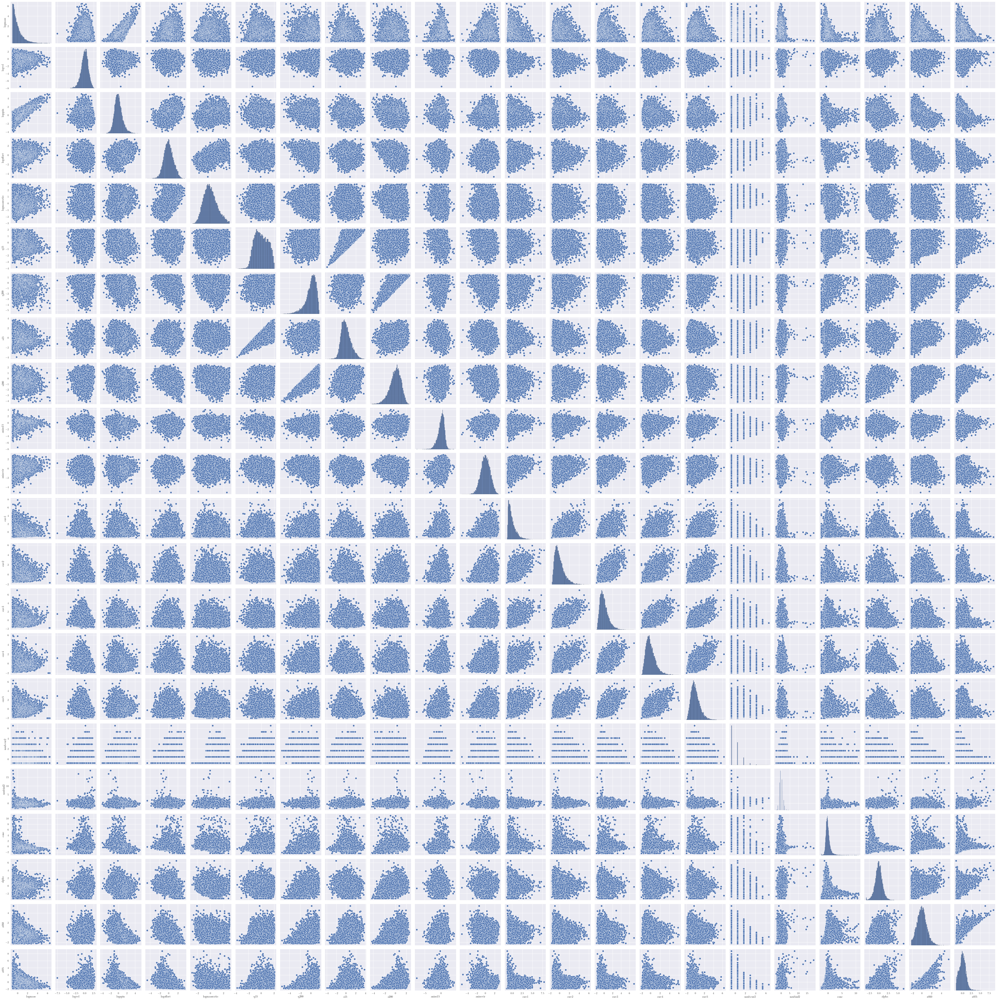

In [22]:
# Pair plot of features

seaborn.pairplot(data_scale)

Text(0.5, 0, 'Illustris Halo Mass $M_{\\rm 200,FP}$')

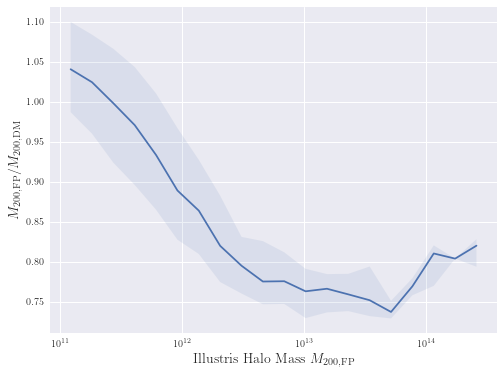

In [36]:
# Plot ratio of halo mass in Illustris to Illutris-Dark

ratio = cat_fp.Group_M_Crit200[GroupIndexFrom]/cat_dm.Group_M_Crit200[GroupIndexTo]
grpmassfp = cat_fp.Group_M_Crit200[GroupIndexFrom]/0.704*1e10

edges = np.logspace(11,14.5,21)
mfp = 10** ((np.log10(edges[1:]) + np.log10(edges[:-1]))/2)

line = []
for i in range(len(edges)-1):
    sl = (grpmassfp > edges[i]) & (grpmassfp < edges[i+1])
    t = ratio[np.where(sl)[0]]
    line.append(np.percentile(t, [50,25,75]))
line=np.array(line)

plt.figure(figsize=(8,6))

plt.semilogx(mfp, line[:,0])
plt.fill_between(mfp, line[:,1], line[:,2], alpha=0.1)
plt.ylabel(r'$M_{\rm 200,FP}/M_{\rm 200, DM}$', fontsize=14)
plt.xlabel(r'Illustris Halo Mass $M_{\rm 200,FP}$', fontsize=14)

Text(0.5, 0, 'Illustris Halo Mass')

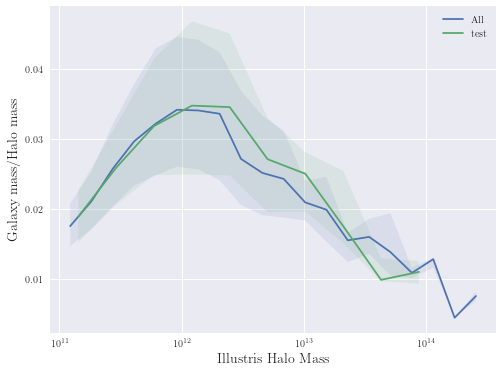

In [37]:
# Plot stellar mass to halo mass ratio in Illustris

# 1. Train set
ratio = 10**(y_train[:,0]-y_train[:,1])
grpmassfp = 10**(y_train[:,1])

edges = np.logspace(11,14.5,21)
mfp = 10** ((np.log10(edges[1:]) + np.log10(edges[:-1]))/2)
line = getline(ratio, y_train, edges)

plt.figure(figsize=(8,6))
plt.semilogx(mfp, line[:,0], label='All')
plt.fill_between(mfp, line[:,1], line[:,2], alpha=0.1)


# 2. Test set
ratio = 10**(y_test[:,0]-y_test[:,1])
grpmassfp = 10**(y_test[:,1])

edges = np.logspace(11,14.1,11)
mfp = 10** ((np.log10(edges[1:]) + np.log10(edges[:-1]))/2)
illustris_formeff = getline(ratio, y_test, edges)

plt.semilogx(mfp, illustris_formeff[:,0], label='test')
plt.fill_between(mfp, illustris_formeff[:,1], illustris_formeff[:,2], alpha=0.1)
plt.legend()

plt.ylabel(r'Galaxy mass/Halo mass', fontsize=14)
plt.xlabel('Illustris Halo Mass', fontsize=14)

### 3. Training

#### 3.1 Linear (ridge) regressor

In [48]:
model_lr = []

for i in range(6):
    model_lr.append(RidgeCV(cv=10))
    model_lr[i].fit(X_train.iloc[:,:],y_train[:,i])
    model_lr[i].score(X_test.iloc[:,:], y_test[:,i])

MSE= 0.02632707095939332 0.909054961838817
R2= 0.909080545551272
MSE= 0.0018599234799375696 0.9904684008214021
R2= 0.9904880774754927
MSE= 0.06494283205821852 0.9142892825010362
R2= 0.9143960643260198
MSE= 0.12248414510994812 0.5520375551153802
R2= 0.5522862897123945
MSE= 0.00902808761481272 0.328870421416233
R2= 0.3311288486523261
MSE= 0.003108931705816494 0.15614638693195526
R2= 0.15617736279846295


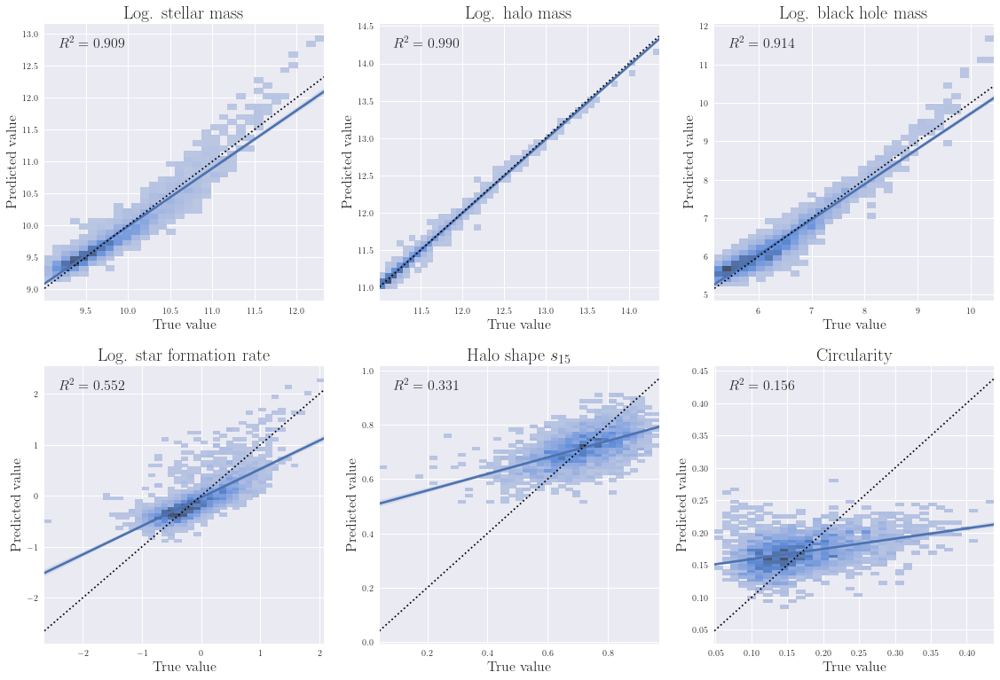

In [49]:
fig,ax = plt.subplots(2,3,figsize=(16,11))
ax = ax.ravel()
titles = ['Log. stellar mass', 'Log. halo mass', 'Log. black hole mass', 
          'Log. star formation rate', 'Halo shape $s_{15}$', 'Circularity']

ypred_lr = []
for i in range(6):
    ypred_lr.append(model_lr[i].predict(X_test))
    mse = ((ypred_lr[i]-y_test[:,i])**2).mean()
    print('MSE=',mse, 1-mse/np.var(y_test[:,i]) )
    #print('R2=',model[i].score(X_test, y_test[:,i]))
    #print('OOB=',model_tf[i].oob_score_)
    r2 = np.corrcoef(ypred_lr[i],y_test[:,i])[0,1]**2
    print('R2=',r2)
    #ax[i].scatter(y_test[:,i],ypred_lr[i])
    df_temp = pd.DataFrame()
    df_temp['True value'] = y_test[:,i]
    df_temp['Predicted value'] = ypred_lr[i]
    seaborn.histplot(df_temp, x='True value', y='Predicted value', ax=ax[i])
    seaborn.regplot(data=df_temp, x='True value', y='Predicted value', ax=ax[i],scatter=False)
    ax[i].set_xlabel('True value', fontsize=16)
    ax[i].set_ylabel('Predicted value', fontsize=16)
    mm = [y_test[:,i].min(),y_test[:,i].max()]
    ax[i].plot(mm,mm,'k:')
    ax[i].text(0.05,0.95,'$R^2 = {:.3f}$'.format(r2), transform=ax[i].transAxes,fontsize=16,va='top')
    #plt.plot([8.5,12.5],[8.5,12.5],'k-')

    ax[i].set_title(titles[i],fontsize=20)
    
fig.tight_layout()
#fig.savefig('ridge_comparison.pdf', bbox_inches='tight')

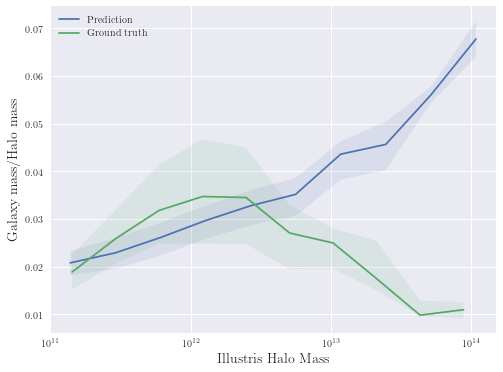

In [50]:
# Stellar mass to halo mass
ratio = 10**(ypred_lr[0]-ypred_lr[1])

edges = np.logspace(ypred_lr[1].min(),ypred_lr[1].max(),11)
mfp_lr = 10** ((np.log10(edges[1:]) + np.log10(edges[:-1]))/2)

line_lr = getline(ratio, np.array(ypred_lr).T, edges)

plt.figure(figsize=(8,6))
plt.semilogx(mfp_lr, line_lr[:,0], label='Prediction')
plt.semilogx(mfp, illustris_formeff[:,0], label='Ground truth')

plt.fill_between(mfp_lr, line_lr[:,1], line_lr[:,2], alpha=0.1)
plt.fill_between(mfp, illustris_formeff[:,1], illustris_formeff[:,2], alpha=0.1)

plt.ylabel(r'Galaxy mass/Halo mass', fontsize=14)
plt.xlabel('Illustris Halo Mass', fontsize=14)
plt.legend()

#### 3.2 Random forest

In [42]:
model_rf = []

for i in range(6):
    model_rf.append(sklearn.ensemble.RandomForestRegressor(random_state=0, n_jobs=32, n_estimators=200,
                                                        min_samples_leaf=1, oob_score=True))
    model_rf[i].fit(X_train,y_train[:,i])
    model_rf[i].score(X_test, y_test[:,i])

In [43]:
for i in range(6):
    print(np.sort(model_rf[i].feature_importances_)[::-1][:5])
    print(data_scale.columns[np.argsort(model_rf[i].feature_importances_)[::-1]][:5])

[0.90696651 0.0082749  0.00739666 0.00712207 0.00665569]
Index(['logmass', 'z075', 'z050', 'logspin', 's200'], dtype='object')
[9.89266464e-01 1.26893191e-03 8.44079266e-04 8.23506956e-04
 7.84782408e-04]
Index(['logmass', 'z050', 'logspin', 'anisovir', 'conc'], dtype='object')
[0.89773017 0.01255087 0.00842264 0.00758561 0.00723124]
Index(['logmass', 'logspin', 's15', 'z050', 'conc'], dtype='object')
[0.62637478 0.04314903 0.03826645 0.02781428 0.02280081]
Index(['logmass', 'conc', 'z050', 'logmassratio', 'anisovir'], dtype='object')
[0.1811226  0.08700436 0.0835808  0.06593007 0.06575111]
Index(['s15', 'z050', 'logspin', 's200', 'logmass'], dtype='object')
[0.19420352 0.08100111 0.07916516 0.0584245  0.04998242]
Index(['logmass', 'q15', 'z050', 'logspin', 's15'], dtype='object')


MSE= 0.019414390271840727 0.9329343371743871
R2= 0.9333431034441366
MSE= 0.0018290749397507074 0.9906264911533311
R2= 0.9906370423416532
MSE= 0.05750982627064075 0.924099268284473
R2= 0.9242362258441598
MSE= 0.08402529378228948 0.692693482890581
R2= 0.6933918448386274
MSE= 0.008741932042982039 0.3501426416832386
R2= 0.35383809808472405
MSE= 0.0025168837250616237 0.3168452619618999
R2= 0.3171550449497271


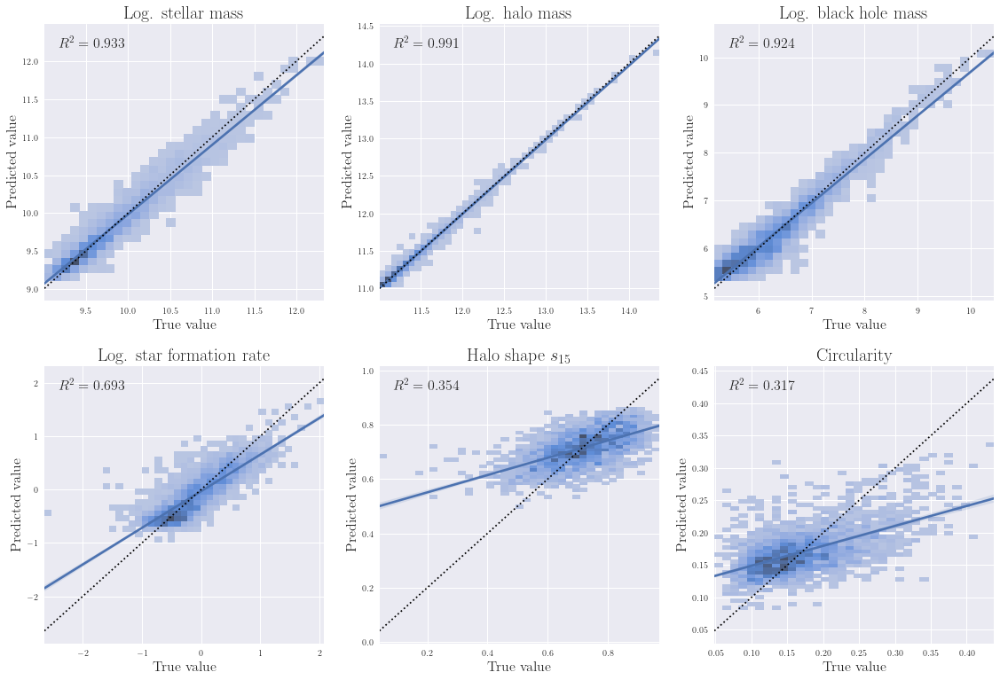

In [44]:
fig,ax = plt.subplots(2,3,figsize=(16,11))
ax = ax.ravel()
titles = ['Log. stellar mass', 'Log. halo mass', 'Log. black hole mass', 
          'Log. star formation rate', 'Halo shape $s_{15}$', 'Circularity']

ypred_rf = []
for i in range(6):
    ypred_rf.append(model_rf[i].predict(X_test))
    mse = ((ypred_rf[i]-y_test[:,i])**2).mean()
    print('MSE=',mse, 1-mse/np.var(y_test[:,i]) )
    #print('R2=',model[i].score(X_test, y_test[:,i]))
    #print('OOB=',model_tf[i].oob_score_)
    r2 = np.corrcoef(ypred_rf[i],y_test[:,i])[0,1]**2
    print('R2=',r2)
    #ax[i].scatter(y_test[:,i],ypred_rf[i])
    df_temp = pd.DataFrame()
    df_temp['True value'] = y_test[:,i]
    df_temp['Predicted value'] = ypred_rf[i]
    seaborn.histplot(df_temp, x='True value', y='Predicted value', ax=ax[i])
    seaborn.regplot(data=df_temp, x='True value', y='Predicted value', ax=ax[i],scatter=False)
    ax[i].set_xlabel('True value', fontsize=16)
    ax[i].set_ylabel('Predicted value', fontsize=16)
    mm = [y_test[:,i].min(),y_test[:,i].max()]
    ax[i].plot(mm,mm,'k:')
    ax[i].text(0.05,0.95,'$R^2 = {:.3f}$'.format(r2), transform=ax[i].transAxes,fontsize=16,va='top')
    #plt.plot([8.5,12.5],[8.5,12.5],'k-')

    ax[i].set_title(titles[i],fontsize=20)

fig.tight_layout()
#fig.savefig('rf_comparison.pdf', bbox_inches='tight')

[1.         0.00912371 0.00815538 0.00785263 0.0073384 ]
['logmass', 'z075', 'z050', 'logspin', 's200']
[1.00000000e+00 1.28269982e-03 8.53237521e-04 8.32442002e-04
 7.93297293e-04]
['logmass', 'z050', 'logspin', 'anisovir', 'conc']
[1.         0.01398067 0.00938216 0.00844977 0.00805502]
['logmass', 'logspin', 's15', 'z050', 'conc']
[1.         0.06888693 0.06109195 0.04440517 0.03640123]
['logmass', 'conc', 'z050', 'logmassratio', 'anisovir']
[1.         0.48036169 0.4614598  0.36400796 0.36301989]
['s15', 'z050', 'logspin', 's200', 'logmass']
[1.         0.41709395 0.40764018 0.30084159 0.25737132]
['logmass', 'q15', 'z050', 'logspin', 's15']


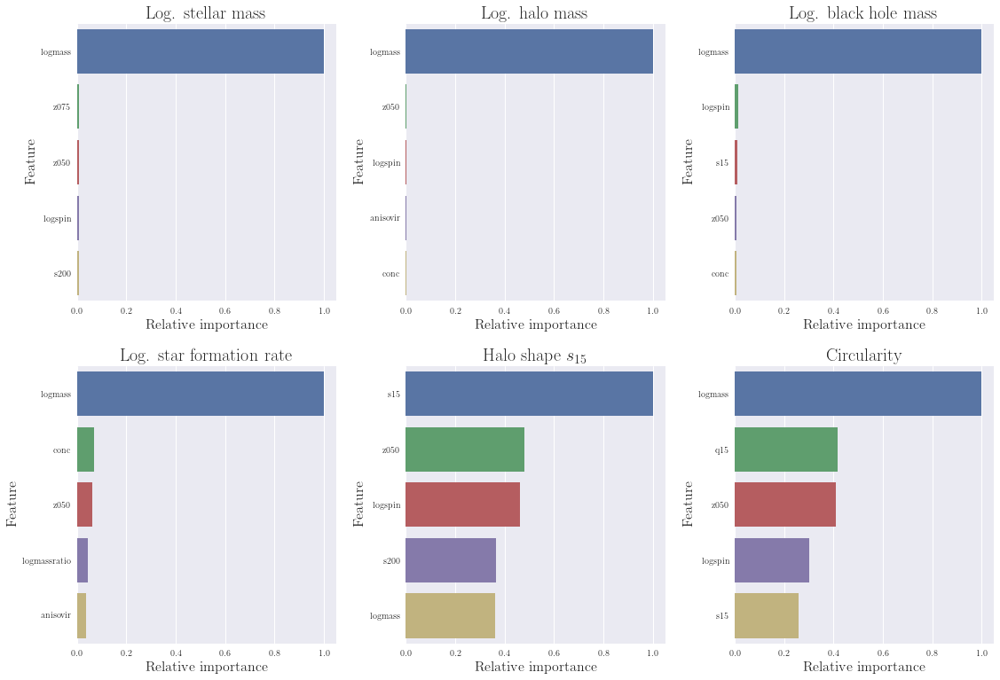

In [45]:
# Plot feature importances

fig,ax = plt.subplots(2,3,figsize=(16,11))
ax = ax.ravel()
titles = ['Log. stellar mass', 'Log. halo mass', 'Log. black hole mass', 
          'Log. star formation rate', 'Halo shape $s_{15}$', 'Circularity']

for i in range(6):
    impt = np.sort(model_rf[i].feature_importances_)[::-1][:5]
    impt /= impt[0]
    labels = data_scale.columns[np.argsort(model_rf[i].feature_importances_)[::-1]][:5]
    labels = [l.replace('_','\_') for l in labels]
    print(impt)
    print(labels)
    
    seaborn.barplot(x=impt, y=labels, ax=ax[i], orient='h')
    ax[i].set_ylabel('Feature', fontsize=16)
    ax[i].set_xlabel('Relative importance', fontsize=16)
    ax[i].set_title(titles[i],fontsize=20)
    
fig.tight_layout()
#fig.savefig('rf_importance.pdf', bbox_inches='tight')

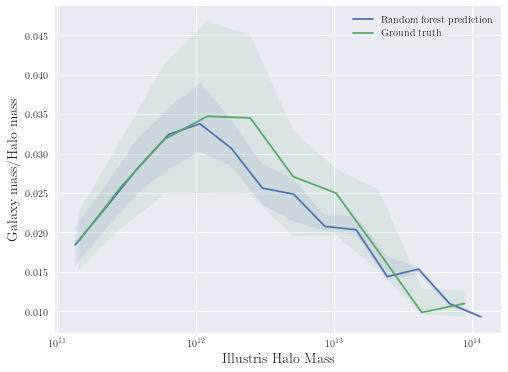

In [46]:
# Stellar mass to halo mass
ratio = 10**(ypred_rf[0]-ypred_rf[1])

edges = np.logspace(ypred_rf[1].min(),ypred_rf[1].max(),15)
mfp_rf = 10** ((np.log10(edges[1:]) + np.log10(edges[:-1]))/2)

line_rf = getline(ratio, np.array(ypred_rf).T, edges)

plt.figure(figsize=(8,6))
plt.semilogx(mfp_rf, line_rf[:,0], label='Random forest prediction')
plt.semilogx(mfp, illustris_formeff[:,0], label='Ground truth')

plt.fill_between(mfp_rf, line_rf[:,1], line_rf[:,2], alpha=0.1)
plt.fill_between(mfp, illustris_formeff[:,1], illustris_formeff[:,2], alpha=0.1)

plt.ylabel(r'Galaxy mass/Halo mass', fontsize=14)
plt.xlabel('Illustris Halo Mass', fontsize=14)
plt.legend()

R2= 0.685744101250226
OOB= 0.6720111691970064
MSE= 0.019757259155311496 0.9317499204293711
R2= 0.932192879908715
MSE= 0.0018753283944390065 0.990389454847553
R2= 0.9904459549676548
MSE= 0.058227811724696606 0.9231516802832941
R2= 0.9233279990293674
MSE= 0.08380689845798885 0.6934922222158811
R2= 0.6940884622545238
MSE= 0.009575227077381825 0.2881971922001063
R2= 0.3135897238441583
MSE= 0.002625056196289138 0.28748413752514945
R2= 0.29249595852008803


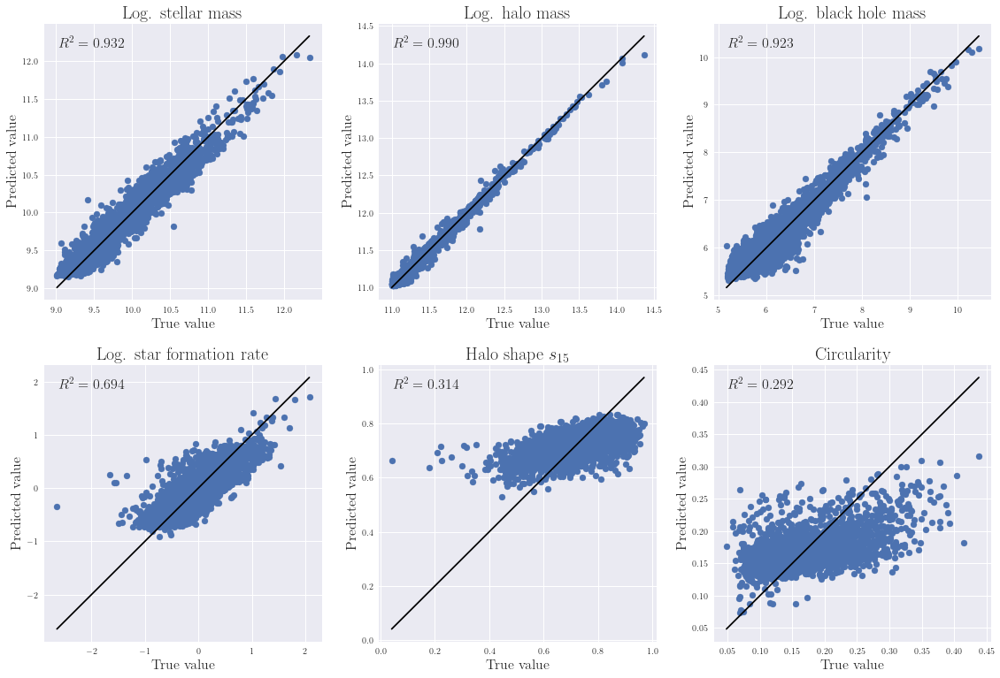

In [59]:
# Alternatively, train only try to predict multiple outputs simultaneously

model_rf2 = sklearn.ensemble.RandomForestRegressor(random_state=0, n_jobs=32, n_estimators=200,
                                                        min_samples_leaf=1, oob_score=True)
model_rf2.fit(X_train,y_train)

ypred_rf2 = model_rf2.predict(X_test)
print('R2=',model_rf2.score(X_test, y_test))
print('OOB=',model_rf2.oob_score_)

fig,ax = plt.subplots(2,3,figsize=(16,11))
ax = ax.ravel()
titles = ['Log. stellar mass', 'Log. halo mass', 'Log. black hole mass', 
          'Log. star formation rate', 'Halo shape $s_{15}$', 'Circularity']

for i in range(6):
    mse = ((ypred_rf2[:,i]-y_test[:,i])**2).mean()
    print('MSE=',mse, 1-mse/np.var(y_test[:,i]) )
    #print('R2=',model[i].score(X_test, y_test[:,i]))
    #print('OOB=',model_tf[i].oob_score_)
    r2 = np.corrcoef(ypred_rf2[:,i],y_test[:,i])[0,1]**2
    print('R2=',r2)
    ax[i].scatter(y_test[:,i],ypred_rf2[:,i])
    ax[i].set_xlabel('True value', fontsize=16)
    ax[i].set_ylabel('Predicted value', fontsize=16)
    mm = [y_test[:,i].min(),y_test[:,i].max()]
    ax[i].plot(mm,mm,'k-')
    ax[i].text(0.05,0.95,'$R^2 = {:.3f}$'.format(r2), transform=ax[i].transAxes,fontsize=16,va='top')
    #plt.plot([8.5,12.5],[8.5,12.5],'k-')

    ax[i].set_title(titles[i],fontsize=20)
    
fig.tight_layout()

### Fully-connected neural network

- We'll use a simply 2 layer network with 64 nodes each.
- Use a batch size of 256 and train for 50 epochs

In [25]:
# Define Keras model for first 4 output features

regularizer = keras.regularizers.l2(1e-3)
#regularizer = None

model = keras.models.Sequential([
    keras.layers.Dense(64, input_shape=(X_train.shape[1],), activation='relu', 
                       name = 'Dense1', kernel_regularizer=regularizer),
    #keras.layers.Dropout(0.1),
    #keras.layers.Dense(32, activation='relu', kernel_regularizer=regularizer),
    #keras.layers.Dropout(0.1),
    keras.layers.Dense(64, activation='relu', 
                       name = 'Dense2', kernel_regularizer=regularizer),
    keras.layers.Dense(6, name='Output')
])

model.compile(optimizer='Adam', loss='mse')
model.summary()

history = []
val_history = []

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Dense1 (Dense)               (None, 64)                1472      
_________________________________________________________________
Dense2 (Dense)               (None, 64)                4160      
_________________________________________________________________
Output (Dense)               (None, 6)                 390       
Total params: 6,022
Trainable params: 6,022
Non-trainable params: 0
_________________________________________________________________


In [29]:
model.fit(X_train, y_train, batch_size=256, epochs=350,
         validation_data=(X_test,y_test))

history.extend(model.history.history['loss'])
val_history.extend(model.history.history['val_loss'])

#model.save('./64_64_masses')

Epoch 1/50
40/40 [==============================] - 0s 4ms/step - loss: 0.0312 - val_loss: 0.0321
Epoch 2/50
40/40 [==============================] - 0s 4ms/step - loss: 0.0314 - val_loss: 0.0313
Epoch 3/50
40/40 [==============================] - 0s 4ms/step - loss: 0.0310 - val_loss: 0.0315
Epoch 4/50
40/40 [==============================] - 0s 4ms/step - loss: 0.0311 - val_loss: 0.0313
Epoch 5/50
40/40 [==============================] - 0s 4ms/step - loss: 0.0309 - val_loss: 0.0314
Epoch 6/50
40/40 [==============================] - 0s 3ms/step - loss: 0.0310 - val_loss: 0.0312
Epoch 7/50
40/40 [==============================] - 0s 4ms/step - loss: 0.0310 - val_loss: 0.0310
Epoch 8/50
40/40 [==============================] - 0s 4ms/step - loss: 0.0309 - val_loss: 0.0320
Epoch 9/50
40/40 [==============================] - 0s 3ms/step - loss: 0.0308 - val_loss: 0.0316
Epoch 10/50
40/40 [==============================] - 0s 4ms/step - loss: 0.0313 - val_loss: 0.0320
Epoch 11/50
40/40 [

Text(0, 0.5, 'Loss (MSE)')

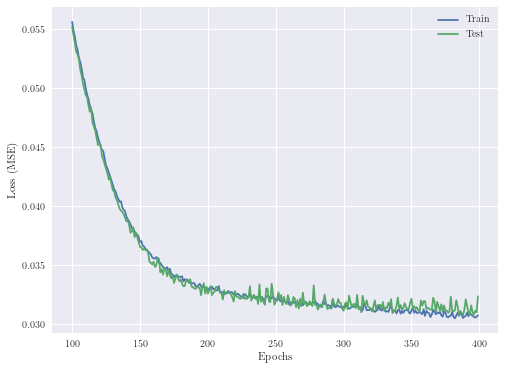

In [51]:
# Plot losses

plt.figure(figsize=(8,6))

N = 300
epochs = np.arange(len(history))
plt.plot(epochs[-N:], history[-N:], label='Train')
plt.plot(epochs[-N:], val_history[-N:], label='Test')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Loss (MSE)')

MSE= 0.020720776285495467 0.9284215174213536
R2= 0.9379256255804191
MSE= 0.0029798823536726763 0.9847289178823968
R2= 0.9887545694938994
MSE= 0.058072827428414686 0.9233562265713815
R2= 0.9273965140527455
MSE= 0.08334697652463874 0.6951742991372217
R2= 0.7049140154818284
MSE= 0.008940920805298383 0.33535022385411195
R2= 0.3631787755861341
MSE= 0.002587998968693722 0.2975425364723415
R2= 0.2996653557676517


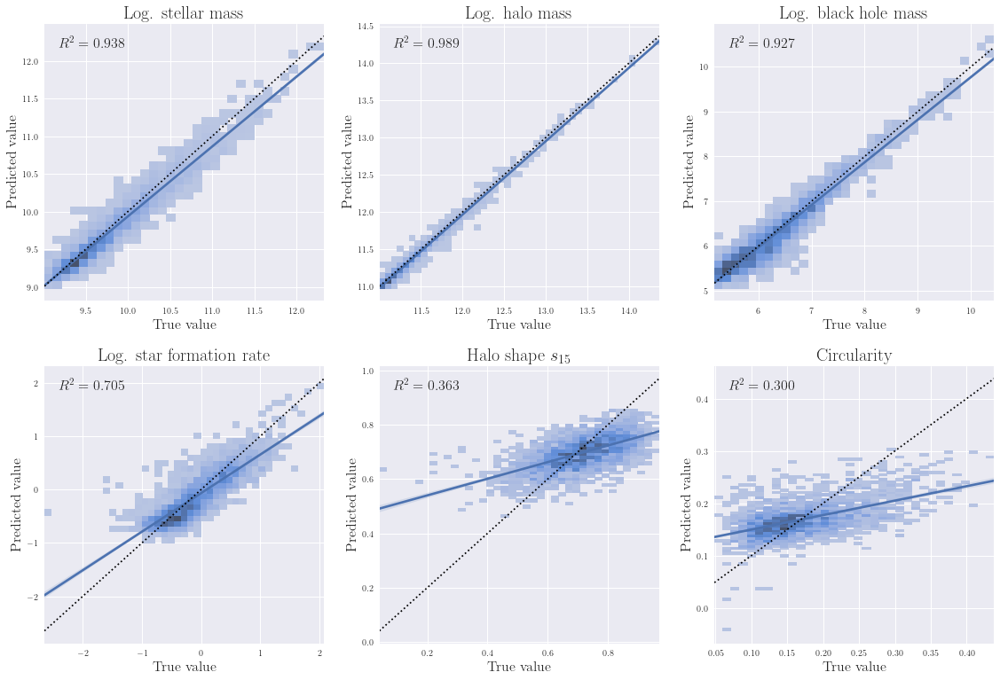

In [31]:
# Plot outputs

#y1 = model.predict(X_test)
#y2 = modelc.predict(X_test)
#ypred_tf = np.hstack((y1,y2))
ypred_tf = model.predict(X_test)


fig,ax = plt.subplots(2,3,figsize=(16,11))
ax = ax.ravel()
titles = ['Log. stellar mass', 'Log. halo mass', 'Log. black hole mass', 
          'Log. star formation rate', 'Halo shape $s_{15}$', 'Circularity']

for i in range(6):
    mse = ((ypred_tf[:,i]-y_test[:,i])**2).mean()
    print('MSE=',mse, 1-mse/np.var(y_test[:,i]) )
    #print('R2=',model[i].score(X_test, y_test[:,i]))
    #print('OOB=',model_tf[i].oob_score_)
    r2 = np.corrcoef(ypred_tf[:,i],y_test[:,i])[0,1]**2
    print('R2=',r2)
    #ax[i].scatter(y_test[:,i],ypred_tf[:,i])
    df_temp = pd.DataFrame()
    df_temp['True value'] = y_test[:,i]
    df_temp['Predicted value'] = ypred_tf[:,i]
    seaborn.histplot(df_temp, x='True value', y='Predicted value', ax=ax[i])
    seaborn.regplot(data=df_temp, x='True value', y='Predicted value', ax=ax[i],scatter=False)
    ax[i].set_xlabel('True value', fontsize=16)
    ax[i].set_ylabel('Predicted value', fontsize=16)
    mm = [y_test[:,i].min(),y_test[:,i].max()]
    ax[i].plot(mm,mm,'k:')
    ax[i].text(0.05,0.95,'$R^2 = {:.3f}$'.format(r2), transform=ax[i].transAxes,fontsize=16,va='top')
    #plt.plot([8.5,12.5],[8.5,12.5],'k-')

    ax[i].set_title(titles[i],fontsize=20)
    
fig.tight_layout()
#fig.savefig('ann_comparison.pdf', bbox_inches='tight')

Text(0.5, 0, 'Illustris Halo Mass')

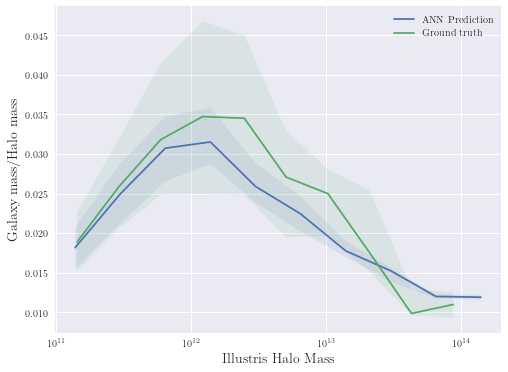

In [39]:
# Plot stellar mass to halo mass

ratio = 10**(ypred_tf[:,0]-ypred_tf[:,1])

edges = np.logspace(ypred_tf[:,1].min(),ypred_tf[:,1].max(),11)
mfp_tf = 10** ((np.log10(edges[1:]) + np.log10(edges[:-1]))/2)

line_tf = getline(ratio, ypred_tf, edges)

plt.figure(figsize=(8,6))
plt.semilogx(mfp_tf, line_tf[:,0], label='ANN Prediction')
plt.semilogx(mfp, illustris_formeff[:,0], label='Ground truth')

plt.fill_between(mfp_tf, line_tf[:,1], line_tf[:,2], alpha=0.1)
plt.fill_between(mfp, illustris_formeff[:,1], illustris_formeff[:,2], alpha=0.1)
plt.legend()

plt.ylabel(r'Galaxy mass/Halo mass', fontsize=14)
plt.xlabel('Illustris Halo Mass', fontsize=14)

### Compare the 3 methods

In [40]:
# Get ground truth

edges = np.logspace(11,14.1,11)
mfp = 10** ((np.log10(edges[1:]) + np.log10(edges[:-1]))/2)
line_test = getline(10**(y_test[:,0]-y_test[:,1]), y_test, edges)
line_test_bh = getline(y_test[:,2], y_test, edges)

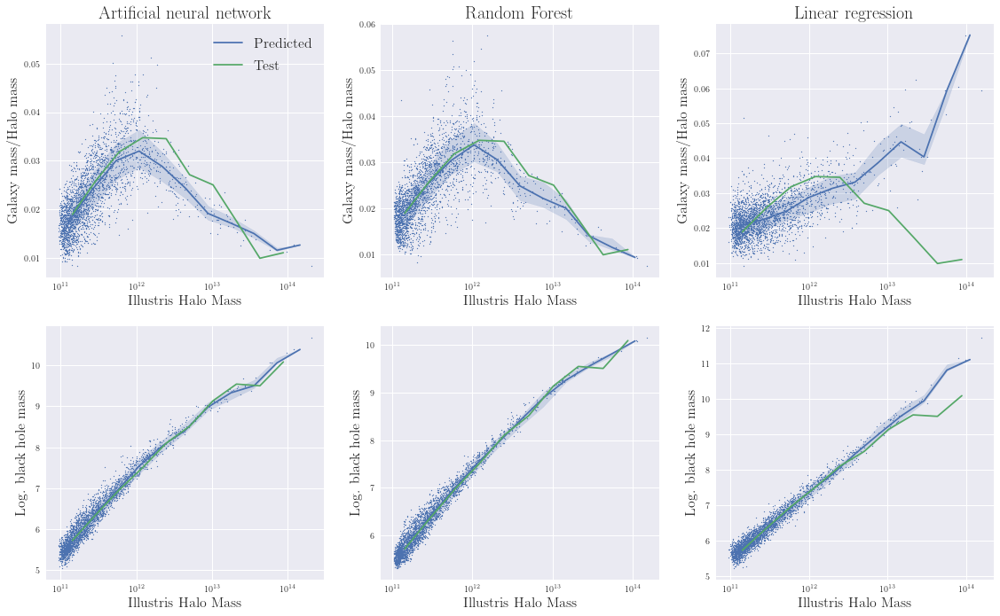

In [52]:
# Plot (1) stellar mass fraction, and (2) Black hole mass

fig,ax = plt.subplots(2,3,figsize=(16,10))
preds = [ypred_tf, ypred_rf, ypred_lr]
labels = ['Artificial neural network', 'Random Forest', 'Linear regression']

for i,ypred in enumerate(preds):
    ypred = np.array(ypred)
    if ypred.shape[0] == 6:
        ypred = ypred.T
    edges = np.logspace(ypred[:,1].min(),ypred[:,1].max(),12)
    x = 10** ((np.log10(edges[1:]) + np.log10(edges[:-1]))/2)
    
    ratio = 10**(ypred[:,0]-ypred[:,1])
    line_pred = getline(ratio, ypred, edges)
    ax[0,i].scatter(10**ypred[:,1], ratio, s=1)
    ax[0,i].semilogx(x, line_pred[:,0], label='Predicted')
    ax[0,i].fill_between(x, line_pred[:,1], line_pred[:,2], alpha=0.2, color='C0')
    
    ax[0,i].semilogx(mfp, line_test[:,0], label='Test')
    ax[0,i].set_ylabel(r'Galaxy mass/Halo mass', fontsize=16)
    
    line_pred = getline(ypred[:,2], ypred, edges)
    ax[1,i].scatter(10**ypred[:,1], ypred[:,2], s=1)
    ax[1,i].semilogx(x, line_pred[:,0])
    ax[1,i].fill_between(x, line_pred[:,1], line_pred[:,2], alpha=0.2, color='C0')
    
    ax[1,i].semilogx(mfp, line_test_bh[:,0])
    ax[1,i].set_ylabel(r'Log. black hole mass', fontsize=16)
    
    
    for j in range(2): ax[j,i].set_xlabel('Illustris Halo Mass', fontsize=16)    
    ax[0,i].set_title(labels[i],fontsize=20)
    
ax[0,0].legend(fontsize=16)

fig.tight_layout()
#fig.savefig('compare_all.pdf', bbox_inches='tight')

### Other regressors

#### HistGradientBoostingRegressor

MSE= 0.01883868490312681 0.9349230713867134
R2= 0.9352934342975983
MSE= 0.0022771476056263947 0.9883302412806448
R2= 0.9884061594368372
MSE= 0.05561967711705997 0.9265938629148432
R2= 0.9266866831824788
MSE= 0.08203192072244227 0.6999838654021684
R2= 0.7007607620147553
MSE= 0.008577661040254302 0.3623542122326109
R2= 0.36339670827715476
MSE= 0.002539736376978327 0.3106423939953835
R2= 0.31066897119868486


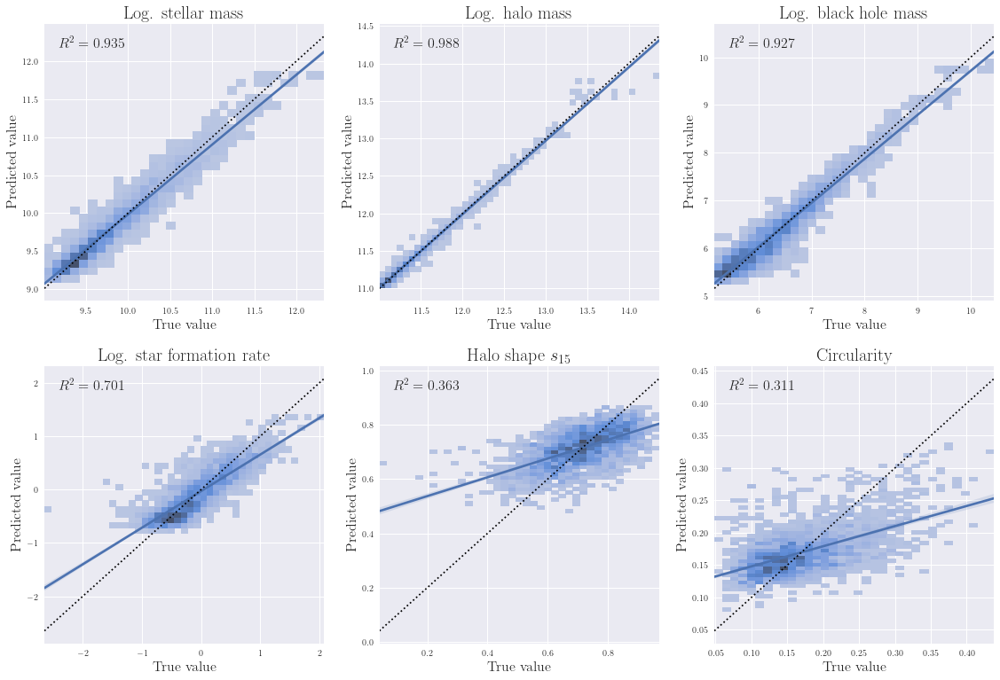

In [67]:
model = []
ypred = []

for i in range(6):
    model.append(sklearn.ensemble.HistGradientBoostingRegressor(random_state=0, verbose=0))
    model[i].fit(X_train.iloc[:,:],y_train[:,i])
    model[i].score(X_test.iloc[:,:], y_test[:,i])
    ypred.append(model[i].predict(X_test.iloc[:,:]))
ypred = np.array(ypred).T

fig,ax = plt.subplots(2,3,figsize=(16,11))
ax = ax.ravel()

for i in range(6):
    mse = ((ypred[:,i]-y_test[:,i])**2).mean()
    print('MSE=',mse, 1-mse/np.var(y_test[:,i]) )
    r2 = np.corrcoef(ypred[:,i],y_test[:,i])[0,1]**2
    print('R2=',r2)
    #ax[i].scatter(y_test[:,i],ypred_tf[:,i])
    df_temp = pd.DataFrame()
    df_temp['True value'] = y_test[:,i]
    df_temp['Predicted value'] = ypred[:,i]
    seaborn.histplot(df_temp, x='True value', y='Predicted value', ax=ax[i])
    seaborn.regplot(data=df_temp, x='True value', y='Predicted value', ax=ax[i],scatter=False)
    ax[i].set_xlabel('True value', fontsize=16)
    ax[i].set_ylabel('Predicted value', fontsize=16)
    mm = [y_test[:,i].min(),y_test[:,i].max()]
    ax[i].plot(mm,mm,'k:')
    ax[i].text(0.05,0.95,'$R^2 = {:.3f}$'.format(r2), transform=ax[i].transAxes,fontsize=16,va='top')
    #plt.plot([8.5,12.5],[8.5,12.5],'k-')
    ax[i].set_title(titles[i],fontsize=20)
    
fig.tight_layout()

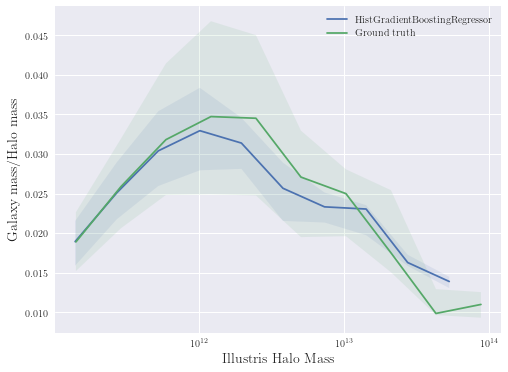

In [69]:
# Plot stellar mass to halo mass
ratio = 10**(ypred[:,0]-ypred[:,1])
edges = np.logspace(ypred[:,1].min(),ypred[:,1].max(),11)
mfp_b = 10** ((np.log10(edges[1:]) + np.log10(edges[:-1]))/2)

line_b = getline(ratio, ypred, edges)

plt.figure(figsize=(8,6))
plt.semilogx(mfp_b, line_b[:,0], label='HistGradientBoostingRegressor')
plt.semilogx(mfp, illustris_formeff[:,0], label='Ground truth')

plt.fill_between(mfp_b, line_b[:,1], line_b[:,2], alpha=0.1)
plt.fill_between(mfp, illustris_formeff[:,1], illustris_formeff[:,2], alpha=0.1)

plt.ylabel('Galaxy mass/Halo mass', fontsize=14)
plt.xlabel('Illustris Halo Mass', fontsize=14)
plt.legend()

#### GradientBoostingRegressor

MSE= 0.019213898578590193 0.9336269218041697
R2= 0.9341565842983439
MSE= 0.0017390678952925087 0.9910877526408493
R2= 0.9911176881475533
MSE= 0.056084958025081975 0.9259797911350757
R2= 0.9262841427622486
MSE= 0.0838945844736263 0.6931715273054346
R2= 0.6936815145895859
MSE= 0.008651626991534506 0.3568557346114164
R2= 0.36205388123092413
MSE= 0.0025196300094075044 0.3160998412878311
R2= 0.3175455550926051


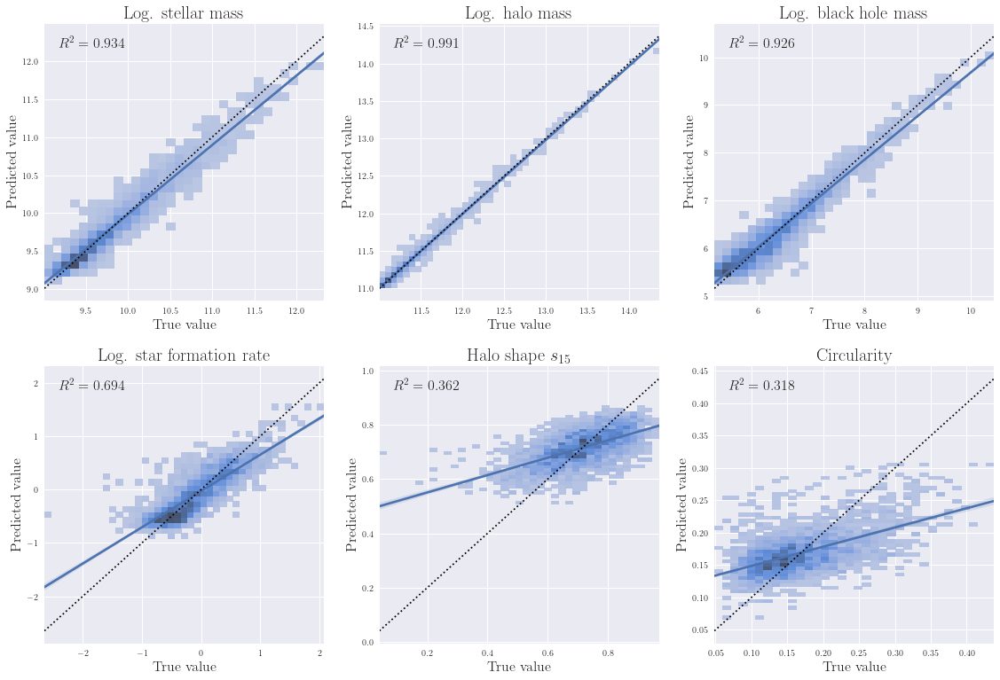

In [70]:
model = []
ypred = []

for i in range(6):
    model.append(sklearn.ensemble.GradientBoostingRegressor(random_state=0, verbose=0))
    model[i].fit(X_train.iloc[:,:],y_train[:,i])
    model[i].score(X_test.iloc[:,:], y_test[:,i])
    ypred.append(model[i].predict(X_test.iloc[:,:]))
ypred = np.array(ypred).T

fig,ax = plt.subplots(2,3,figsize=(16,11))
ax = ax.ravel()

for i in range(6):
    mse = ((ypred[:,i]-y_test[:,i])**2).mean()
    print('MSE=',mse, 1-mse/np.var(y_test[:,i]) )
    r2 = np.corrcoef(ypred[:,i],y_test[:,i])[0,1]**2
    print('R2=',r2)
    #ax[i].scatter(y_test[:,i],ypred_tf[:,i])
    df_temp = pd.DataFrame()
    df_temp['True value'] = y_test[:,i]
    df_temp['Predicted value'] = ypred[:,i]
    seaborn.histplot(df_temp, x='True value', y='Predicted value', ax=ax[i])
    seaborn.regplot(data=df_temp, x='True value', y='Predicted value', ax=ax[i],scatter=False)
    ax[i].set_xlabel('True value', fontsize=16)
    ax[i].set_ylabel('Predicted value', fontsize=16)
    mm = [y_test[:,i].min(),y_test[:,i].max()]
    ax[i].plot(mm,mm,'k:')
    ax[i].text(0.05,0.95,'$R^2 = {:.3f}$'.format(r2), transform=ax[i].transAxes,fontsize=16,va='top')
    #plt.plot([8.5,12.5],[8.5,12.5],'k-')
    ax[i].set_title(titles[i],fontsize=20)
    
fig.tight_layout()

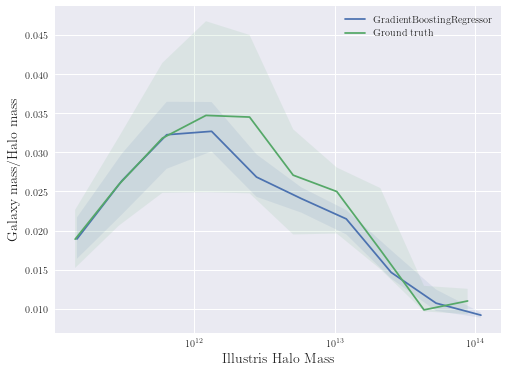

In [71]:
# Plot stellar mass to halo mass
ratio = 10**(ypred[:,0]-ypred[:,1])
edges = np.logspace(ypred[:,1].min(),ypred[:,1].max(),11)
mfp_b = 10** ((np.log10(edges[1:]) + np.log10(edges[:-1]))/2)

line_b = getline(ratio, ypred, edges)

plt.figure(figsize=(8,6))
plt.semilogx(mfp_b, line_b[:,0], label='GradientBoostingRegressor')
plt.semilogx(mfp, illustris_formeff[:,0], label='Ground truth')

plt.fill_between(mfp_b, line_b[:,1], line_b[:,2], alpha=0.1)
plt.fill_between(mfp, illustris_formeff[:,1], illustris_formeff[:,2], alpha=0.1)

plt.ylabel('Galaxy mass/Halo mass', fontsize=14)
plt.xlabel('Illustris Halo Mass', fontsize=14)
plt.legend()

#### K Nearest Neighbors (KNN)

MSE= 0.07174690108032068 0.7521553131846479
R2= 0.7636095008984524
MSE= 0.02597184536611579 0.8669013953376987
R2= 0.8828398892751708
MSE= 0.17393714969465565 0.7704399788618866
R2= 0.7800746215515517
MSE= 0.14434629115405215 0.4720809175967008
R2= 0.4725234311171347
MSE= 0.011362394323782866 0.15534283232793278
R2= 0.17377829929370034
MSE= 0.0032282527841010354 0.1237592094210419
R2= 0.15173352610709043


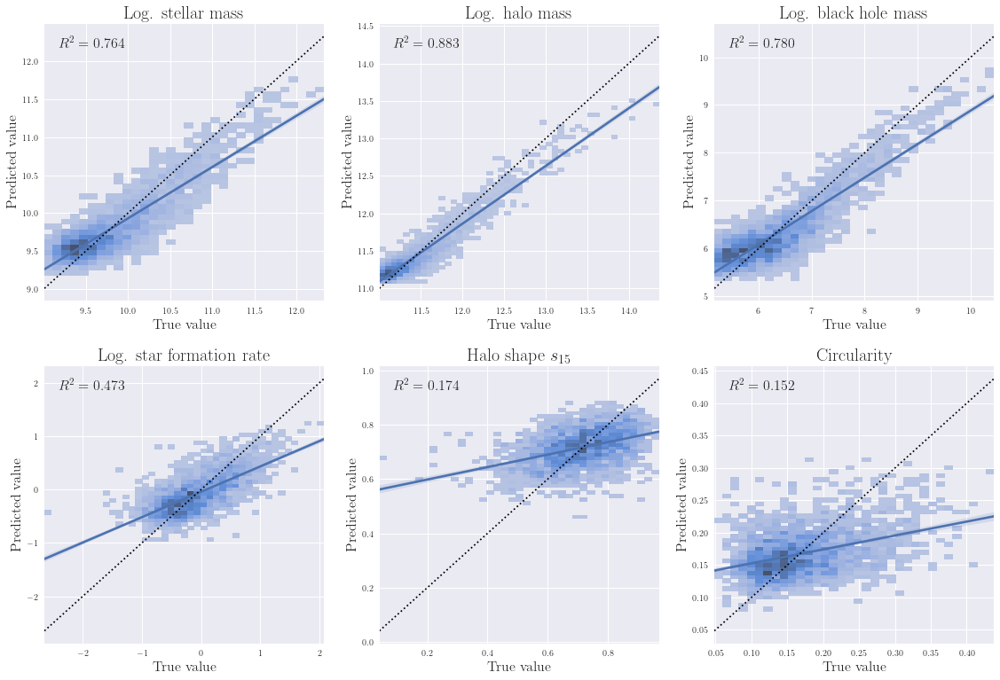

In [64]:
model = []
ypred = []

for i in range(6):
    model.append(KNeighborsRegressor(5))
    model[i].fit(X_train.iloc[:,:],y_train[:,i])
    model[i].score(X_test.iloc[:,:], y_test[:,i])
    ypred.append(model[i].predict(X_test.iloc[:,:]))
ypred = np.array(ypred).T

fig,ax = plt.subplots(2,3,figsize=(16,11))
ax = ax.ravel()

for i in range(6):
    mse = ((ypred[:,i]-y_test[:,i])**2).mean()
    print('MSE=',mse, 1-mse/np.var(y_test[:,i]) )
    r2 = np.corrcoef(ypred[:,i],y_test[:,i])[0,1]**2
    print('R2=',r2)
    #ax[i].scatter(y_test[:,i],ypred_tf[:,i])
    df_temp = pd.DataFrame()
    df_temp['True value'] = y_test[:,i]
    df_temp['Predicted value'] = ypred[:,i]
    seaborn.histplot(df_temp, x='True value', y='Predicted value', ax=ax[i])
    seaborn.regplot(data=df_temp, x='True value', y='Predicted value', ax=ax[i],scatter=False)
    ax[i].set_xlabel('True value', fontsize=16)
    ax[i].set_ylabel('Predicted value', fontsize=16)
    mm = [y_test[:,i].min(),y_test[:,i].max()]
    ax[i].plot(mm,mm,'k:')
    ax[i].text(0.05,0.95,'$R^2 = {:.3f}$'.format(r2), transform=ax[i].transAxes,fontsize=16,va='top')
    #plt.plot([8.5,12.5],[8.5,12.5],'k-')
    ax[i].set_title(titles[i],fontsize=20)
    
fig.tight_layout()

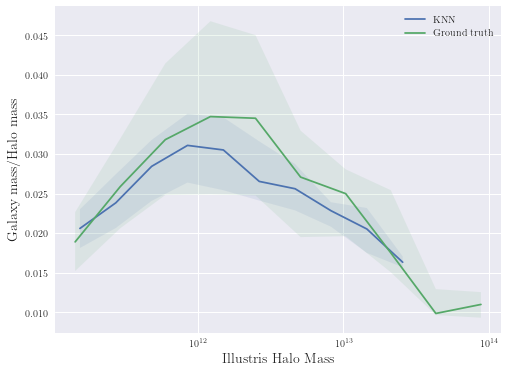

In [66]:
# Plot stellar mass to halo mass
ratio = 10**(ypred[:,0]-ypred[:,1])
edges = np.logspace(ypred[:,1].min(),ypred[:,1].max(),11)
mfp_b = 10** ((np.log10(edges[1:]) + np.log10(edges[:-1]))/2)

line_b = getline(ratio, ypred, edges)

plt.figure(figsize=(8,6))
plt.semilogx(mfp_b, line_b[:,0], label='KNN')
plt.semilogx(mfp, illustris_formeff[:,0], label='Ground truth')

plt.fill_between(mfp_b, line_b[:,1], line_b[:,2], alpha=0.1)
plt.fill_between(mfp, illustris_formeff[:,1], illustris_formeff[:,2], alpha=0.1)

plt.ylabel('Galaxy mass/Halo mass', fontsize=14)
plt.xlabel('Illustris Halo Mass', fontsize=14)
plt.legend()